# Project 4
## Please add the folders dataset and tests to contents folder

In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

In [118]:
import numpy as np
import math
import cv2
import os
from google.colab.patches import cv2_imshow
from skimage import color, io, filters
from sklearn.cluster import KMeans
from scipy import ndimage
import matplotlib.pyplot as plt
import random
import pickle
# initializing sift detector
sift = cv2.SIFT_create()

In [119]:
def matching(voc_tree, src_image, dst_image):
    src_kps, src_des = src_image
    dst_kps, dst_des = dst_image
    matches = []

    for i in range(src_des.shape[0]):
        # distance between descriptors
        distances = np.linalg.norm(dst_des - src_des[i, :], axis=1)

        # best and second-best matches
        best_match_idx = np.argmin(distances)
        best_match_distance = distances[best_match_idx]
        distances[best_match_idx] = float('inf')
        second_best_match_idx = np.argmin(distances)
        second_best_match_distance = distances[second_best_match_idx]

        # reliable match check
        phi = best_match_distance / second_best_match_distance
        if phi < 0.8:
            matches.append([src_kps[i], dst_kps[best_match_idx]])

    return matches

In [120]:
def compute_homography(reference_points, test_points):
    A = np.zeros((2 * reference_points.shape[0], 9))

    for i in range(reference_points.shape[0]):
        x_s, y_s = reference_points[i]
        x_d, y_d = test_points[i]

        A[2*i] = [x_s, y_s, 1, 0, 0, 0, -x_s*x_d, -y_s*x_d, -x_d]
        A[2*i+1] = [0, 0, 0, x_s, y_s, 1, -x_s*y_d, -y_s*y_d, -y_d]

    _, _, V = np.linalg.svd(A)
    h = V[-1] / V[-1, -1]
    return h.reshape(3, 3)

In [121]:
def RANSAC(voc_tree, src_image, dst_image):
    matches = matching(voc_tree, src_image, dst_image)

    # RANSAC for best homography
    best_h = None
    max_inliers = 0

    for _ in range(1000):
        # randomly selecting four points to get a homography
        random_sample = random.sample(matches, 4)
        src_pts = np.array([i[0].pt for i in random_sample])
        dst_pts = np.array([i[1].pt for i in random_sample])
        h = compute_homography(src_pts, dst_pts)

        # computing the number of inliers
        inliers_count = 0
        for i in range(len(matches)):
            src_keypoint, dst_keypoint = matches[i]
            transformed_point = np.dot(h, np.append(src_keypoint.pt, 1))
            transformed_point /= transformed_point[2]

            error = np.linalg.norm(transformed_point[:2] - dst_keypoint.pt)
            if error < 10:
                inliers_count += 1

        # updating best homography
        if inliers_count > max_inliers:
            max_inliers = inliers_count

    return max_inliers

In [122]:
class VocabularyTree:
    class Node:
        def __init__(self):
            self.kmeans = None
            self.children = []
            self.index = 0
            self.images = None

    def __init__(self, k, L):
        self.k = k
        self.L = L
        self.tree = None
        self.descriptors_with_img = []
        self.num_imgs = 0
        self.weights = np.zeros(self.k ** self.L)
        self.db_vectors = {}
        self.num_leafs = 0
        self.num_descriptors = {}
        self.database_vectors = {}
        self.database_sift = {}

    def fit(self, images):
        self.num_imgs = len(images)
        self.feature_extraction(images)
        self.tree = self.build_tree(self.descriptors_with_img, self.L)
        self._compute_database_vectors()

    def build_tree(self, descriptors, level):
        node = self.Node()

        # reached the maximum depth or leaf node
        if len(descriptors) < self.k or level == 0:
            index = self.num_leafs
            node.index = index
            self.num_leafs += 1
            images = [x[0] for x in descriptors]
            node.images = set(images)

            for image in images:
                self.num_descriptors[image][index] += 1

            self.weights[index] = np.log(self.num_imgs / len(images))
            return node

        # run k-means clustering
        node.kmeans = KMeans(n_clusters=self.k, n_init='auto').fit([x[1] for x in descriptors])
        labels = np.array(node.kmeans.labels_)

        # recursively build sub-trees
        for i in range(self.k):
            child_descriptors = []
            for j in range(len(descriptors)):
                if labels[j] == i:
                    child_descriptors.append(descriptors[j])
            node.children.append(self.build_tree(child_descriptors, level - 1))

        return node

    # d_i = m_i*w_i, m_i is the number of descriptor vectors of the database image
    def _compute_database_vectors(self):
        images = [x[0] for x in self.descriptors_with_img]
        for img in images:
            m_i = self.num_descriptors[img]
            self.database_vectors[img] = m_i * self.weights

    # q_i = n_i*w_i, n_i is the number of descriptor vectors of the query image
    def _compute_query_vector(self, query_desc):
        nodes = []
        n = np.zeros(len(self.weights))
        for desc in query_desc:
            closest = self.closest_node(self.tree, desc)
            nodes.append(closest)
            n[closest.index] += 1
        q = n * self.weights
        return q, nodes

    def closest_node(self, root, desc):
        if len(root.children) == 0: return root
        distances = np.linalg.norm(root.kmeans.cluster_centers_ - desc, axis=1)
        return self.closest_node(root.children[np.argmin(distances)], desc)

    def compute_score(self, query):
        _, query_desc = self.feature_extraction(io.imread(query))
        q_i, nodes = self._compute_query_vector(query_desc)
        q_i = q_i / np.linalg.norm(q_i, ord=1)  # normalize query vector
        targets = set()
        for node in nodes:
            targets.update(node.images)
        targets = list(targets)
        total = len(targets)
        scores = np.zeros(total)
        for i in range(total):
            image = targets[i]
            d_i = self.database_vectors[image]
            d_i = d_i / np.linalg.norm(d_i, ord=1)  # normalize database vector
            scores[i] = np.linalg.norm(d_i - q_i, ord=1)  # compute L1 distance
        sorted = np.argsort(scores)
        # return [[targets[i], scores[i]] for i in sorted]
        return [targets[i] for i in sorted], [scores[i] for i in sorted]

    def feature_extraction(self, image):
        if isinstance(image, list):
            for img in image:
                self.num_descriptors[img[0]] = np.zeros(self.k ** self.L)
                gray_img = cv2.cvtColor(img[1], cv2.COLOR_RGB2GRAY)
                # sift keypoints and descriptors
                kps, desc = sift.detectAndCompute(gray_img, None)
                self.descriptors_with_img.extend([img[0], d] for d in desc)
                self.database_sift[img[0]] = [kps, desc]
            return
        gray_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        # sift keypoints and descriptors
        kps, des = sift.detectAndCompute(gray_img, None)
        return kps, des

    def save(self, filename):
        with open(filename, 'wb') as file:
            pickle.dump(self, file)

    def load(filename):
        with open(filename, 'rb') as file:
            return pickle.load(file)

In [123]:
dataset_images = []
for i in range(1, 102):
    dataset_images.append([str(i) + '.jpg', io.imread(f'dataset/{i}.jpg')])

In [126]:
voc_tree = VocabularyTree(k=10, L=4)
voc_tree.fit(dataset_images)

In [ ]:
test_images = []
for i in range(1, 13):
    for j in range(5):
        if os.path.isdir(f'test{i}/crops/book'):
            print(f'Books detected in test{i}, stopping further processing')
            break
        else:
            print(f'No books detected in test{i}, removing directory')
            !rm -rf 'test{i}'
        !yolo predict model=yolov8n.pt conf=0.25 source='tests/test{i}.jpg' save_crop=True name='../../test{i}'
    books = os.listdir(f'test{i}/crops/book')
    for book in books:
        image = f'test{i}/crops/book/{book}'
        test_images.append([f'test{i}.jpg', image])

test0.jpg


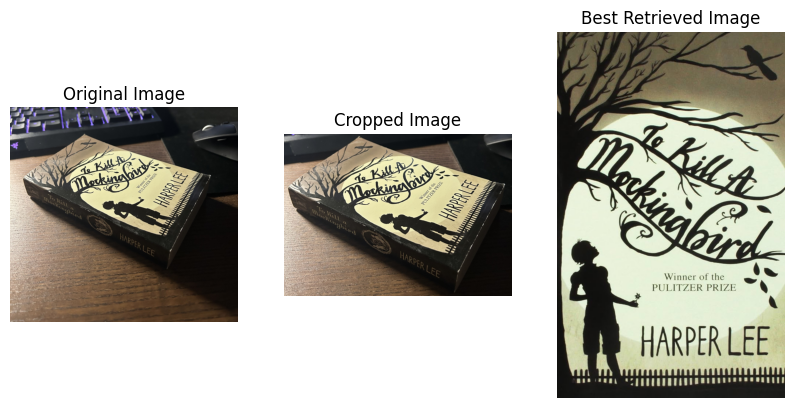

test1.jpg


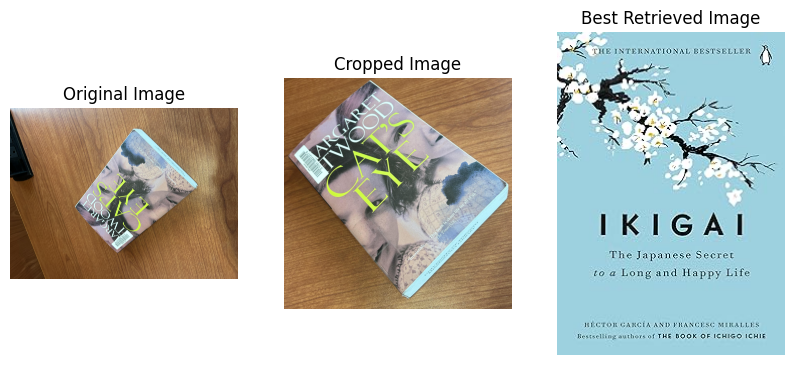

test2.jpg


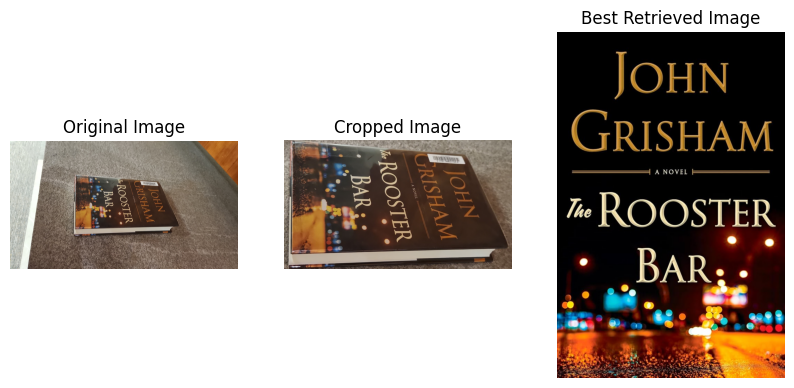

test3.jpg


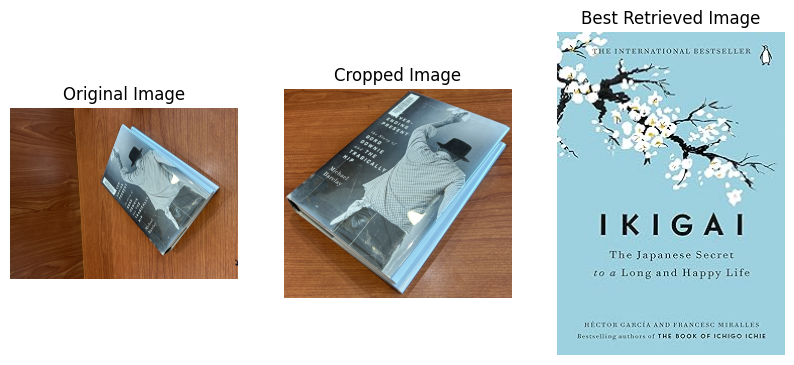

test4.jpg


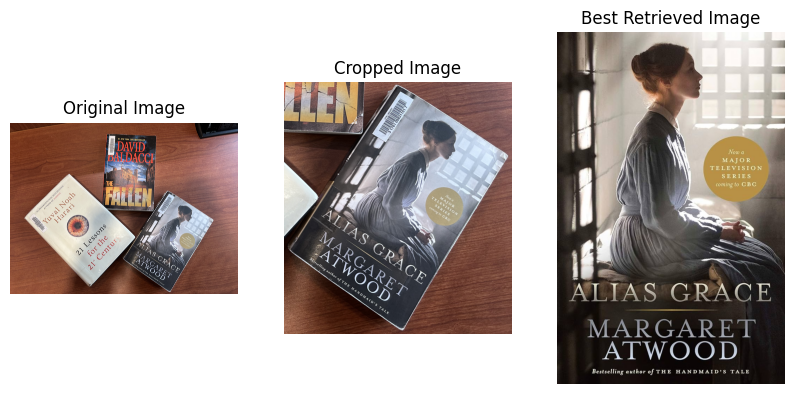

test4.jpg


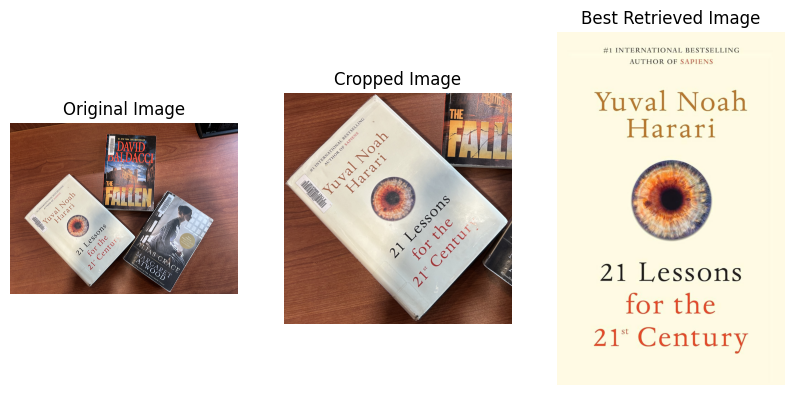

test4.jpg


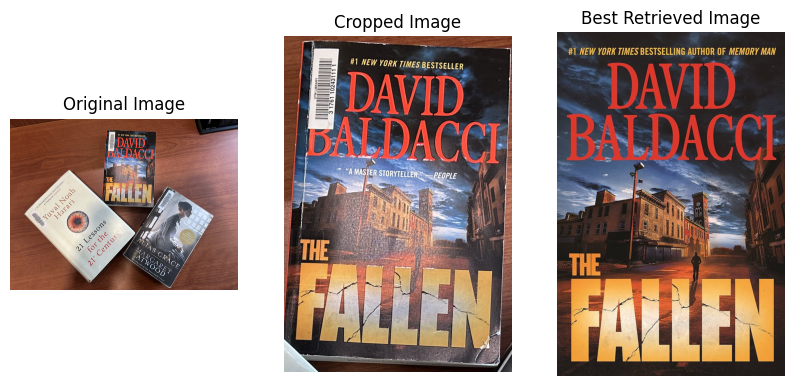

test5.jpg


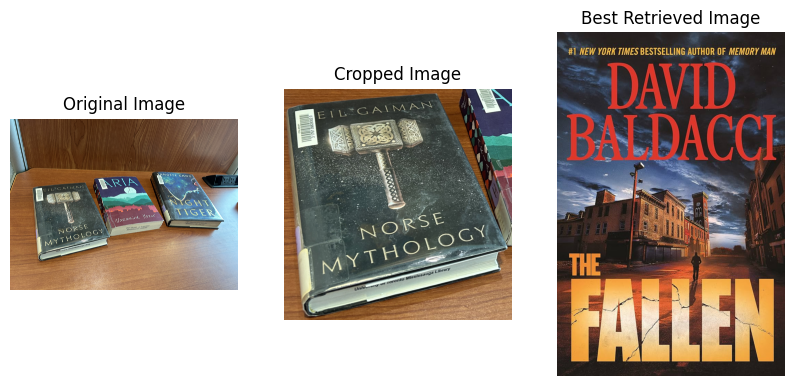

test5.jpg


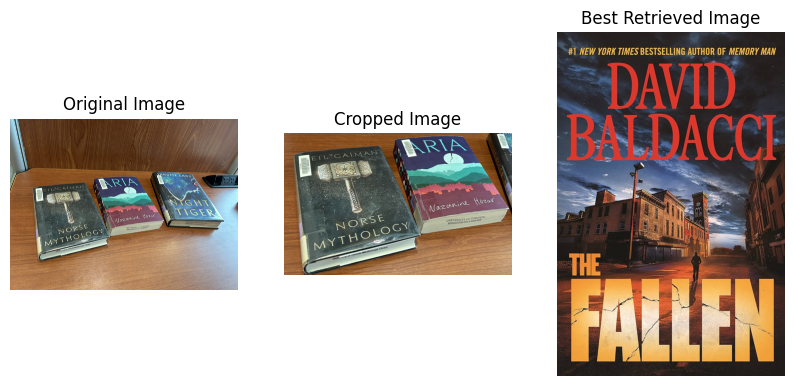

<ipython-input-127-c5e2718a8f9d>:20: RuntimeWarning: divide by zero encountered in divide
  transformed_point /= transformed_point[2]
<ipython-input-127-c5e2718a8f9d>:20: RuntimeWarning: invalid value encountered in divide
  transformed_point /= transformed_point[2]


test5.jpg


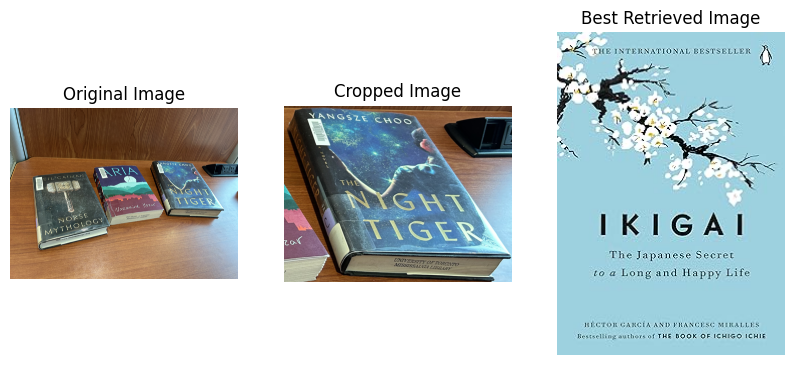

test6.jpg


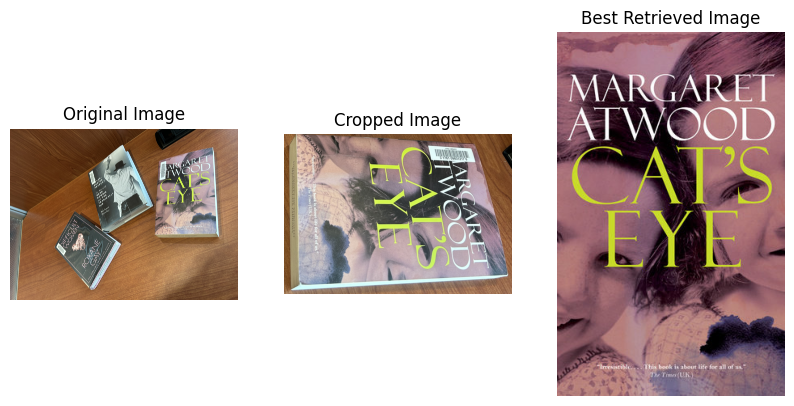

test6.jpg


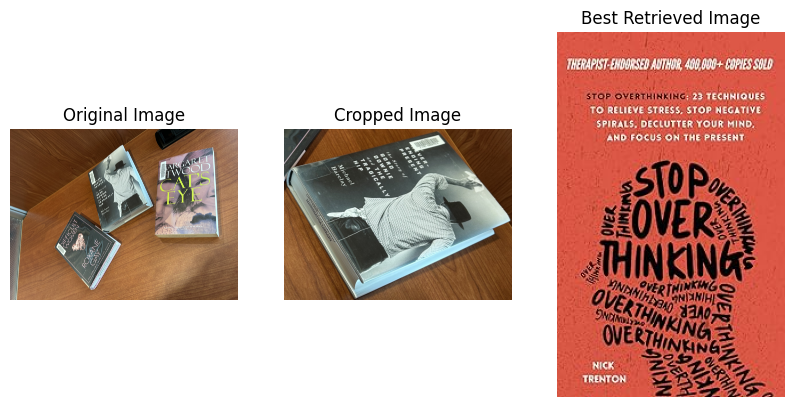

test6.jpg


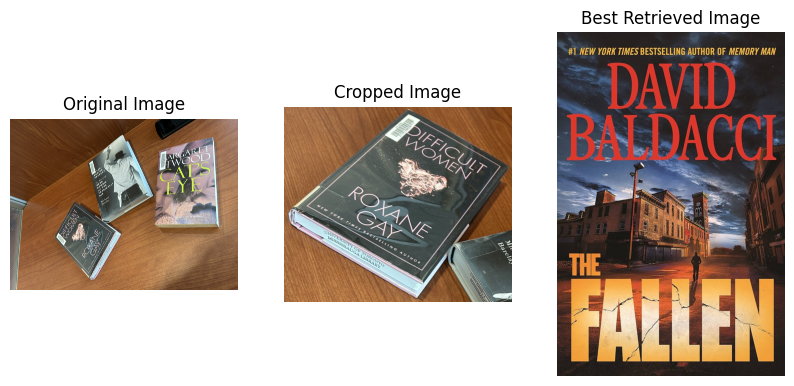

test7.jpg


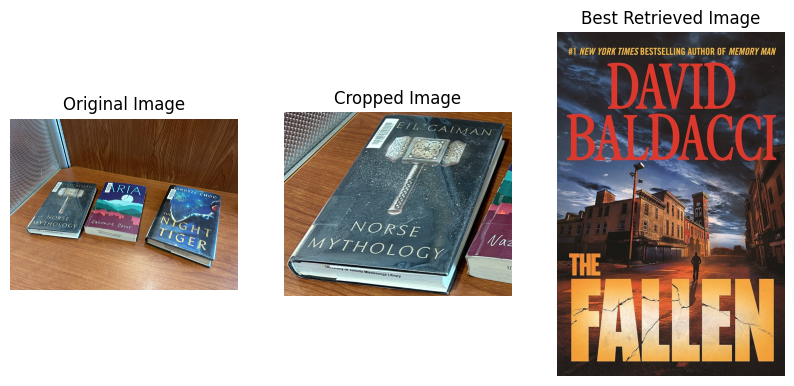

test7.jpg


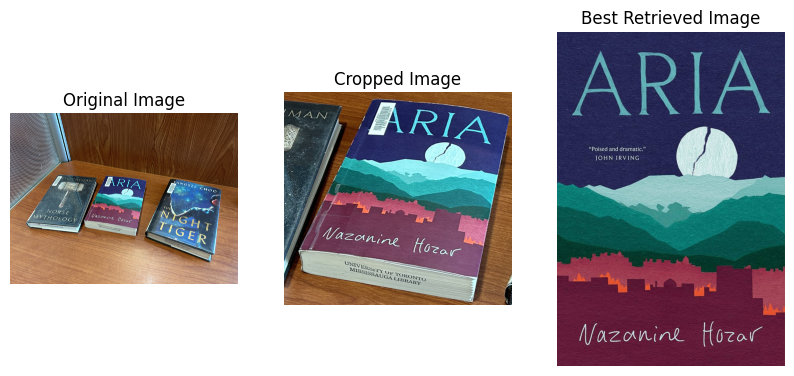

test7.jpg


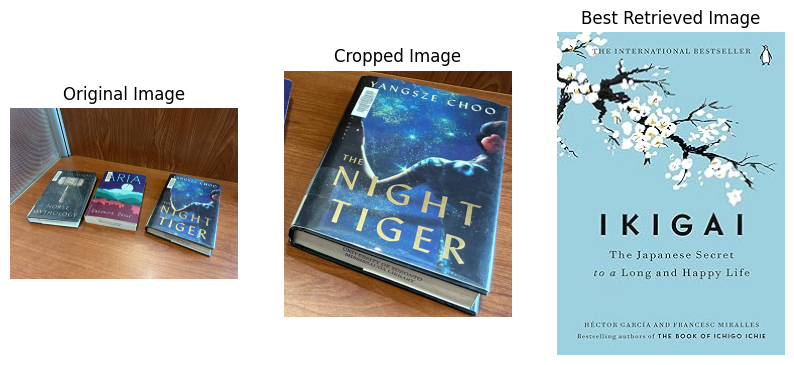

test8.jpg


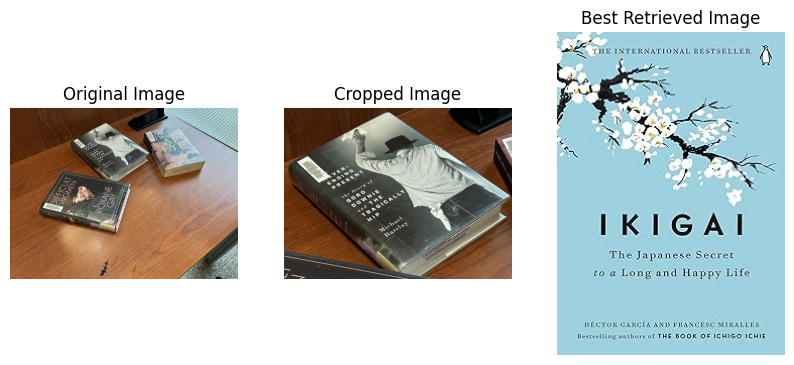

test8.jpg


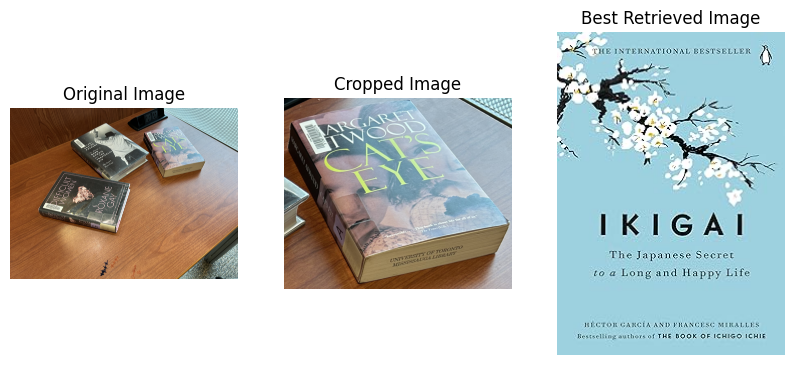

test8.jpg


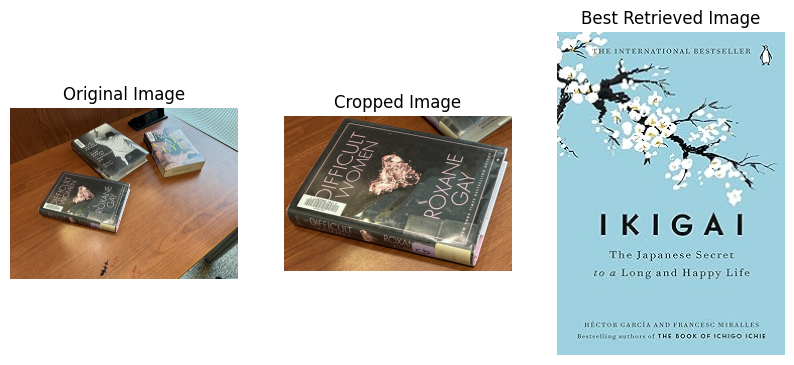

test9.jpg


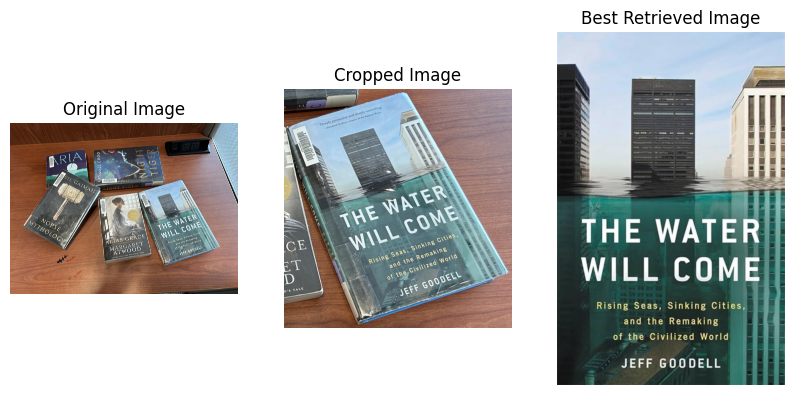

test9.jpg


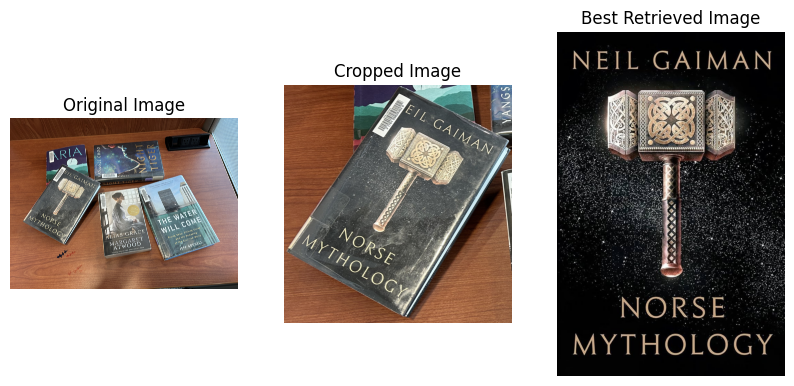

test9.jpg


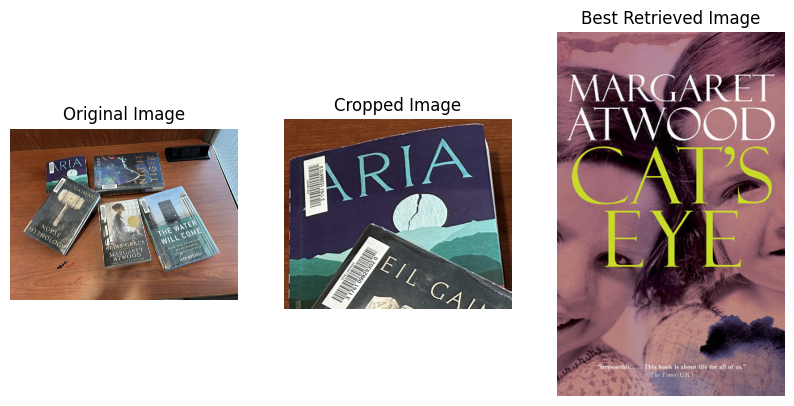

test9.jpg


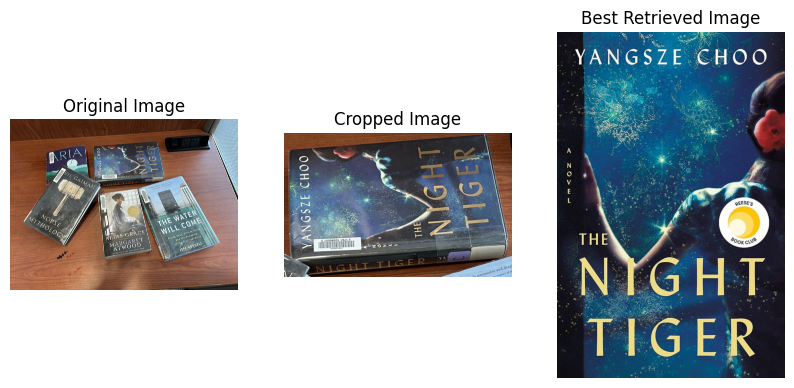

test9.jpg


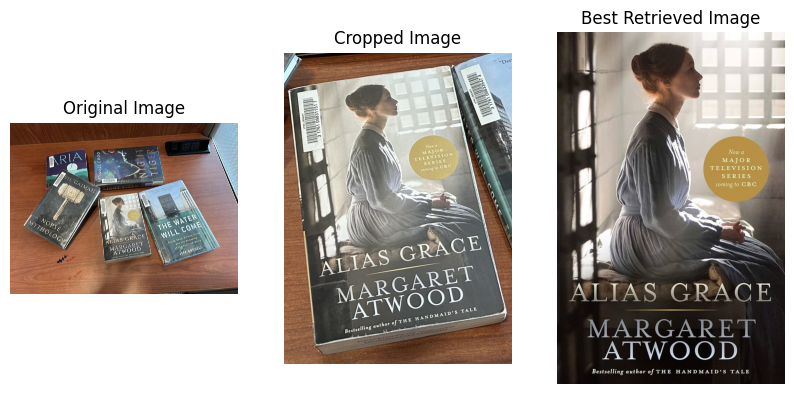

test9.jpg


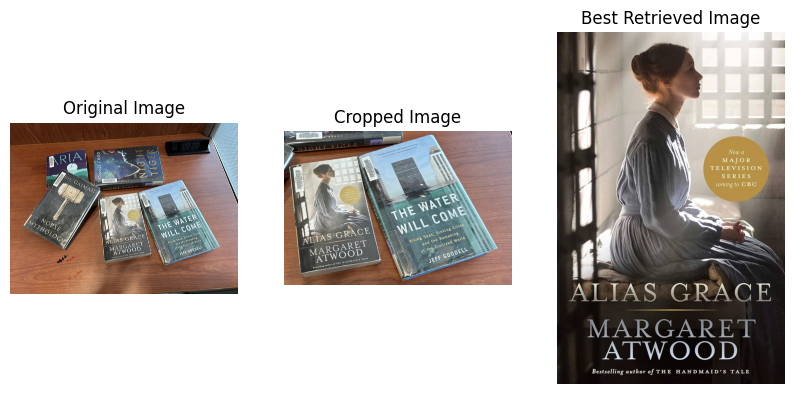

test10.jpg


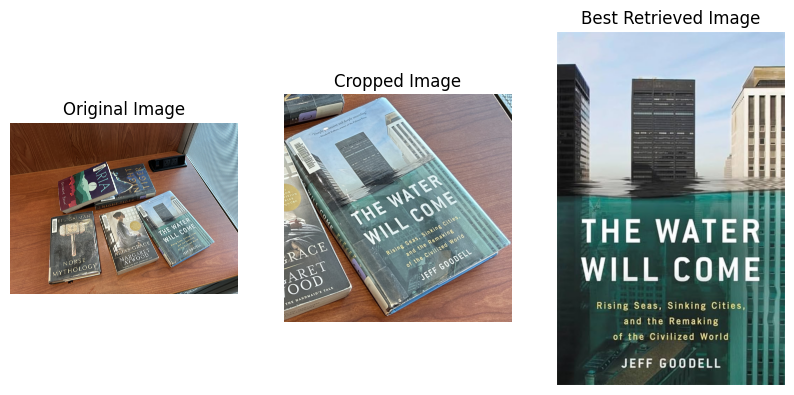

test10.jpg


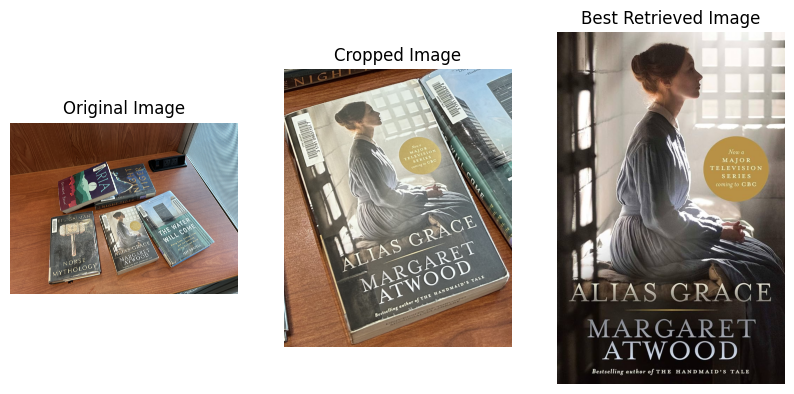

test10.jpg


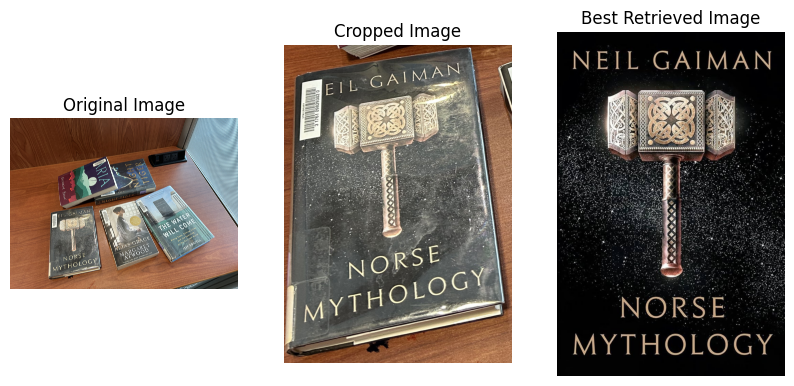

test10.jpg


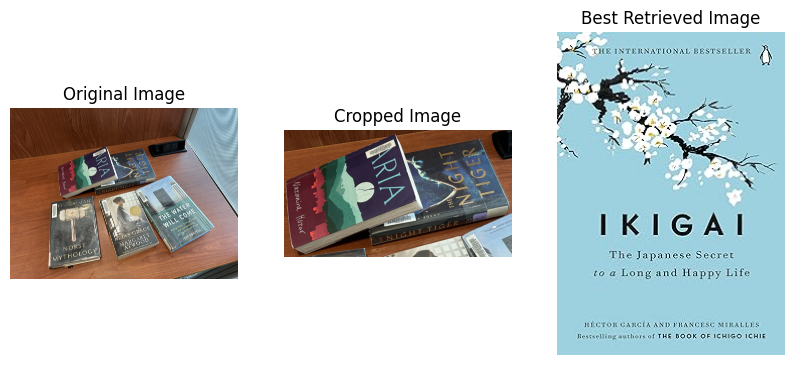

In [ ]:
for path, image in test_images:
    targets, scores = voc_tree.compute_score(image)
    top_10_targets = targets[:10]
    max_inliers = 0
    query = voc_tree.feature_extraction(io.imread(image))
    for img in top_10_targets:
        inliers = RANSAC(voc_tree, query, voc_tree.database_sift[img])
        if inliers > max_inliers:
            max_inliers = inliers
            best_match = img
    cropped_image = io.imread(image)
    best_image = io.imread(f'dataset/{best_match}')
    original_image = io.imread(f'tests/{path}')
    print(path)
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(original_image)
    plt.title('Original Image')
    plt.axis('off')


    plt.subplot(1, 3, 2)
    plt.imshow(cropped_image)
    plt.title('Cropped Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(best_image)
    plt.title('Best Retrieved Image')
    plt.axis('off')

    plt.show()